# Applied Data Science Capstone - Analysis of Luxembourgish Population Behaviour

## A. Collecting Data and polishing the data sets

All data sets were collected from [This website](https://statistiques.public.lu/en/index.html). The website allows to collect data from several periods on multiple topics and you can download everything in xls-format.

For this study, following data sets were downloaded:
* Population per canton and municipality (1995-2020)
* Population Density per canton and municipality (1995-2020)
* Employment and Unemployment rates and percentage per canton and municipality (per yearly document 2010-2018)
* Net Migration within cantons and municipalities (2010-2018)
* Victims in accidents per canton and municipality (per yearly document 2010-2018)

Not all data sets are available for the same time period, but there are overlaps in the time periods! Analysis of the subsets will be performed and, given certain time periods, correlations between subsets will be analyzed.


In [231]:
#Import packages

%matplotlib inline

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import scipy

#clustering module
from sklearn.cluster import KMeans
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler

#Data analysis library
import pandas as pd
import xlrd

#Handling vectorized data
import numpy as np

#geo-locators and plotters
from geopy import Nominatim
import folium
import requests

Let's handle all the data sets using pandas

In [2]:
#**************************************************
#Population per canton and municipality 1995-2020
#**************************************************
Population = pd.read_excel("PopulationPerCanton.xls")

#Drop empty lines
Population.drop([0,1,2,3,5],inplace=True)

#replace header for years
Population.replace(to_replace ="Year", 
                 value ="Canton & Municipality", inplace=True) 
Population.rename(columns=Population.iloc[0],inplace=True)
Population.drop([4],inplace=True)


#new numbering of rows
Population = Population.reset_index(drop=True)
Population.set_index("Canton & Municipality", inplace=True)

#Divide into cantons and municipalities
Population_canton = Population[Population.index.str.contains('Canton')]
Population_municipality = Population[~Population.index.str.contains('Canton|Grand Duchy')]

print("The shape of the canton population dataset is: ", Population_canton.shape)
print("The shape of the municipality population dataset is: ", Population_municipality.shape)

The shape of the canton population dataset is:  (12, 26)
The shape of the municipality population dataset is:  (102, 26)


In [3]:
#**************************************************
#Population Density per canton and municipality 1995-2020
#**************************************************
Population_Density = pd.read_excel("PopulationDensity.xls")

#Drop empty lines
Population_Density.drop([0,1,2,3,5],inplace=True)

#replace header for years
Population_Density.replace(to_replace ="Year", 
                 value ="Canton & Municipality", inplace=True) 
Population_Density.rename(columns=Population_Density.iloc[0],inplace=True)
Population_Density.drop([4],inplace=True)


#new numbering of rows
Population_Density = Population_Density.reset_index(drop=True)
Population_Density.set_index("Canton & Municipality", inplace=True)

Population_Density.head()

#Divide into cantons and municipalities
Population_Density_canton = Population_Density[Population_Density.index.str.contains('Canton')]
Population_Density_municipality = Population_Density[~Population_Density.index.str.contains('Canton|Grand Duchy')]

print("The shape of the canton population density dataset is: ", Population_Density_canton.shape)
print("The shape of the municipality population density dataset is: ", Population_Density_municipality.shape)

The shape of the canton population density dataset is:  (12, 26)
The shape of the municipality population density dataset is:  (102, 26)


In [4]:
#**************************************************
#Unemployment rate per canton and municipality 2010-2018
#**************************************************

#Loop over all Employment-files to merge information together, after reformatting them
years=list(range(2010,2019))
Unemployment = {}
Unemployment_rate = pd.DataFrame()
for i in range(2019-2010):
    Unemployment[i] = pd.read_excel("Employment%d.xls"%years[i])

    #Drop empty lines
    Unemployment[i].drop([0,1,2,3,5],inplace=True)

    #replace header for the yearly unemployment rates
    Unemployment[i].replace(to_replace ="Measures", 
                     value ="Canton & Municipality", inplace=True) 
    Unemployment[i].replace(to_replace ="Uneimployment rate (in %)", 
                     value ="Unemployment rate %d"%years[i], inplace=True) 
    Unemployment[i].rename(columns=Unemployment[i].iloc[0],inplace=True)
    Unemployment[i].drop([4],inplace=True)


    #new numbering of rows
    Unemployment[i] = Unemployment[i].reset_index(drop=True)
    Unemployment[i].set_index("Canton & Municipality", inplace=True)

#Merge the dataframes in the dictionnary to one single dataframe
Unemployment_list = [ v for k,v in Unemployment.items()] 
Unemployment_rate = pd.concat(Unemployment_list ,axis=1)

#Divide into cantons and municipalities
Unemployment_canton = Unemployment_rate[Unemployment_rate.index.str.contains('Canton')]
Unemployment_municipality = Unemployment_rate[~Unemployment_rate.index.str.contains('Canton|Grand Duchy')]


print("The shape of the canton unemployment rate dataset is: ", Unemployment_canton.shape)
print("The shape of the municipality unemployment rate dataset is: ", Unemployment_municipality.shape)

The shape of the canton unemployment rate dataset is:  (12, 9)
The shape of the municipality unemployment rate dataset is:  (102, 9)


In [5]:
#**************************************************
#Net Migration (People in - People out) per canton and municipality 2010-2018
#**************************************************
Migration = pd.read_excel("NetMigration.xls")

#Drop empty lines
Migration.drop([0,1,2,3,5,6],inplace=True)

#replace header for years
Migration.replace(to_replace ="Year", 
                 value ="Canton & Municipality", inplace=True) 
Migration.rename(columns=Migration.iloc[0],inplace=True)
Migration.drop([4],inplace=True)


#new numbering of rows
Migration = Migration.reset_index(drop=True)
Migration.set_index("Canton & Municipality", inplace=True)

#Divide into cantons and municipalities
Migration_canton = Migration[Migration.index.str.contains('Canton')]
Migration_municipality = Migration[~Migration.index.str.contains('Canton|Grand Duchy')]

print("The shape of the canton migrations dataset is: ", Migration_canton.shape)
print("The shape of the municipality migrations dataset is: ", Migration_municipality.shape)

The shape of the canton migrations dataset is:  (12, 9)
The shape of the municipality migrations dataset is:  (102, 9)


In [6]:
#**************************************************
#Victims in accidents per canton and municipality 2010-2018
#**************************************************

#Loop over all Accidents-files to merge information together, after reformatting them
years=list(range(2010,2019))
Accidents = {}
Accidents_number = pd.DataFrame()
for i in range(2019-2010):
    Accidents[i] = pd.read_excel("Accidents%d.xls"%years[i])

    #Drop empty lines
    Accidents[i].drop([0,1,3,4,5],inplace=True)

    #replace header for the yearly unemployment rates
    Accidents[i].replace(to_replace ="Year", 
                     value ="Canton & Municipality", inplace=True) 
    Accidents[i].rename(columns=Accidents[i].iloc[0],inplace=True)
    Accidents[i].drop([2],inplace=True)


    #new numbering of rows
    Accidents[i] = Accidents[i].reset_index(drop=True)
    Accidents[i].set_index("Canton & Municipality", inplace=True)

#Merge the dataframes in the dictionnary to one single dataframe
Accidents_list = [ v for k,v in Accidents.items()] 
Accidents_number = pd.concat(Accidents_list ,axis=1)

Accidents_canton = Accidents_number[Accidents_number.index.str.contains('Canton')]
Accidents_municipality = Accidents_number[~Accidents_number.index.str.contains('Canton|Grand Duchy')]

print("The shape of the canton accidents dataset is: ", Accidents_canton.shape)
print("The shape of the municipality accidents dataset is: ", Accidents_municipality.shape)

The shape of the canton accidents dataset is:  (12, 9)
The shape of the municipality accidents dataset is:  (102, 9)


In [7]:
#**************************************************
#Merge datasets to contains all information of 2018 (as last common year) to use location data with
#**************************************************

Lux_canton2018 = pd.DataFrame({"Population Density": Population_Density_canton[2018.0],
                            "Net Migration": Migration_canton["2018"],
                 "Accident Victims": Accidents_canton["2018"],
                 "Unemployment rate": Unemployment_canton["Unemployment rate 2018"]})
Lux_municipality2018 = pd.DataFrame({"Population Density": Population_Density_municipality[2018.0],
                            "Net Migration": Migration_municipality["2018"],
                 "Accident Victims": Accidents_municipality["2018"],
                 "Unemployment rate": Unemployment_municipality["Unemployment rate 2018"]})

print("The shape of the 2018 canton dataset is: ", Lux_canton2018.shape)
print("The shape of the 2018 municipality dataset is: ", Lux_municipality2018.shape)

Lux_municipality2018.dropna(inplace=True)

The shape of the 2018 canton dataset is:  (12, 4)
The shape of the 2018 municipality dataset is:  (104, 4)


We do not have a full set of data for every column, as seen in the 2018 municipality dataset number of rows (104 instead of 102). That is why we remove all entries containing "NaN values"

## B. Plot geolocation and get overview of the municipalities/cantons

Later on, the population density of 2020 is used together with venue data for each municipality to find out where most people live in Luxembourg and why they prefer to live there.

In [8]:
address = 'Luxembourg'

geolocator = Nominatim(user_agent="my-application")
location = geolocator.geocode(address)
lux_latitude = location.latitude
lux_longitude = location.longitude
print('The geograpical coordinate of Luxembourg are {}, {}.'.format(lux_latitude, lux_longitude))

The geograpical coordinate of Luxembourg are 49.8158683, 6.1296751.


Get geocoordinates of every municipality:

In [9]:
Latitude_mun = []
Longitude_mun = []

for items in Lux_municipality2018.index:
    location = geolocator.geocode(items+", Luxembourg")
    Latitude_mun.append(location.latitude)
    Longitude_mun.append(location.longitude)

Lux_municipality2018["Latitude"]=Latitude_mun
Lux_municipality2018["Longitude"]=Longitude_mun


Get geocoordinates for every canton:

In [11]:
Latitude_can = []
Longitude_can = []

for items in Lux_canton2018.index:
    location = geolocator.geocode(items+", Luxembourg")
    Latitude_can.append(location.latitude)
    Longitude_can.append(location.longitude)

Lux_canton2018["Latitude"]=Latitude_can
Lux_canton2018["Longitude"]=Longitude_can

In [363]:
# create map of Luxembourg using latitude and longitude values
map_luxembourg = folium.Map(location=[lux_latitude, lux_longitude], zoom_start=9)

# add municipality markers to map
for lat_mun, lng_mun, name_mun, density_mun in zip(Lux_municipality2018['Latitude'], Lux_municipality2018['Longitude'], Lux_municipality2018.index, Lux_municipality2018["Population Density"]):
    label_mun = '{}, {}'.format(name_mun, int(density_mun))
    label_mun = folium.Popup(label_mun, parse_html=True)
    folium.CircleMarker(
        [lat_mun, lng_mun],
        radius=5,
        popup=label_mun,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_luxembourg) 

# add canton markers to map
for lat_can, lng_can, name_can, density_can in zip(Lux_canton2018['Latitude'], Lux_canton2018['Longitude'], Lux_canton2018.index, Lux_canton2018["Population Density"]):
    label_can = '{}, {}'.format(name_can, int(density_can))
    label_can = folium.Popup(label_can, parse_html=True)
    folium.CircleMarker(
        [lat_can, lng_can],
        radius=5,
        popup=label_can,
        color='red',
        fill=True,
        fill_color='#FF0000',
        fill_opacity=0.7,
        parse_html=False).add_to(map_luxembourg) 
    
map_luxembourg

## C. Data Analysis: Changes over the years in cantons

Let's try to understand our cantonal datasets a little better.

### 1) Change in Population 

In [18]:
#Plot of the population change from 1995-2020 per canton
plt.style.use('fivethirtyeight')
fig,ax = plt.subplots()
years = list(range(1995,2021))
for index,item in enumerate(years):
    years[index] = float(item)

color_index=0
colors_array = cm.rainbow(np.linspace(0, 1, len(Population_canton.index)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

Growth_rate=[]

for items in Population_canton.index:
    y_pop = Population_canton.loc[items][years]
    ax.plot(years, y_pop, label=str(items), color=rainbow[color_index])
    color_index += 1
    #Calculate the growth rate given by the trendlines for each canton
    slope, intercept = np.polyfit(years,y_pop,1)
    Growth_rate.append(int(slope))
    print(items+" displays a growth rate of "+str(int(slope))+ " People/Year. They count "+str(int(Population_canton.loc[items][-3]))+ " people in 2020.")

fig.set_size_inches((14,10))
fig.set_dpi(800)
plt.legend()
plt.xlabel('Year')
plt.ylabel('Population per capita')
plt.title('Population of Luxembourgish cantons per year')
    


   

Canton Capellen displays a growth rate of 575 People/Year. They count 48187 people in 2020.
Canton Esch displays a growth rate of 2329 People/Year. They count 176820 people in 2020.
Canton Luxembourg displays a growth rate of 2881 People/Year. They count 182607 people in 2020.
Canton Mersch displays a growth rate of 481 People/Year. They count 32112 people in 2020.
Canton Clervaux displays a growth rate of 297 People/Year. They count 18081 people in 2020.
Canton Diekirch displays a growth rate of 388 People/Year. They count 32543 people in 2020.
Canton Redange displays a growth rate of 282 People/Year. They count 18664 people in 2020.
Canton Vianden displays a growth rate of 82 People/Year. They count 5163 people in 2020.
Canton Wiltz displays a growth rate of 288 People/Year. They count 16735 people in 2020.
Canton Echternach displays a growth rate of 287 People/Year. They count 18899 people in 2020.
Canton Grevenmacher displays a growth rate of 450 People/Year. They count 29828 peopl

Text(0.5, 1.0, 'Population of Luxembourgish cantons per year')

Observation: All cantons show a net increase of population over the course of the last 25 years. If we assume a linear increase over the course of the last 25 years, we can define a growth rate.

Surprisingly, this growth rate is relatively slow for most cantons. Esch and Luxembourg show the steepest increase; these cantons are by far (~100.000) the most populated amongst the 12 cantons.
Capellen is the third most populated canton, reaching >50000 people in 2020.

Even though, Grevenmacher currently has less people than Diekirch (30887 vs 33782), the growth rate is higher (450 vs 388 people/year), hinting at a preferential population (from net migration / natural balance) of the first canton over the latter.



In [19]:
#Plot of the net migration from 2010-2018 per canton
plt.style.use('fivethirtyeight')
fig,ax = plt.subplots()
years = list(range(2010,2019))
years_num = list(range(2010,2019))
for index,item in enumerate(years):
    years[index] = str(item)
    years_num[index] = float(item)

color_index=0
colors_array = cm.rainbow(np.linspace(0, 1, len(Migration_canton.index)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

migration_std= []
mean_nm=[]
slopes_nm=[]

for items in Migration_canton.index:
    y_pop = Migration_canton.loc[items][years]
    ax.plot(years, y_pop, label=str(items), color=rainbow[color_index])
    color_index += 1
    migration_std.append(int(np.std(y_pop)))
    mean_nm.append(int(np.mean(y_pop)))
    #Calculate the trend (increasing, decreasing migration) given by the trendlines for each canton
    slope, intercept = np.polyfit(years_num,y_pop.astype(float),1)
    slopes_nm.append(int(slope))
    print("The mean of net migration for 2010-2018 in "+ items + " is: "+ str(int(np.mean(y_pop)))+"\nThe overall trend, given by the slope of the trendline is: "+ str(int(slope)))

fig.set_size_inches((14,10))
fig.set_dpi(800)
plt.legend()
plt.xlabel('Year')
plt.ylabel('Net migration')
plt.title('Net migration in Luxembourgish cantons per year')
    

The mean of net migration for 2010-2018 in Canton Capellen is: 740
The overall trend, given by the slope of the trendline is: 26
The mean of net migration for 2010-2018 in Canton Esch is: 2706
The overall trend, given by the slope of the trendline is: 224
The mean of net migration for 2010-2018 in Canton Luxembourg is: 3821
The overall trend, given by the slope of the trendline is: -110
The mean of net migration for 2010-2018 in Canton Mersch is: 526
The overall trend, given by the slope of the trendline is: -7
The mean of net migration for 2010-2018 in Canton Clervaux is: 297
The overall trend, given by the slope of the trendline is: 9
The mean of net migration for 2010-2018 in Canton Diekirch is: 496
The overall trend, given by the slope of the trendline is: 15
The mean of net migration for 2010-2018 in Canton Redange is: 262
The overall trend, given by the slope of the trendline is: 16
The mean of net migration for 2010-2018 in Canton Vianden is: 76
The overall trend, given by the s

Text(0.5, 1.0, 'Net migration in Luxembourgish cantons per year')

This analysis is based on observations, summarized in the table below!

The highest changes in migration during the period of 2010-2018 unsurprisingly occur for the most populated cantons, namely Esch and Luxembourg. 

The other 10 cantons have a low standard deviation (<150 people), indicating that there is little fluctuation of incoming/outgoing people with respect to the mean of the years. The mean is close to the respective predicted growth rate (<6%). This highlights that net migration is probably the most contributing factor to population growth (R^2 for those 10 cantons = 0.92)!
If we trace a trendline throughout 2010-2018, we observe more emigration with negative slopes: this is the case for Luxembourg, Mersch, Echternach and Grevenmacher. Vianden seems to stagnate with a slope close to 0.

In [20]:
df = pd.DataFrame({"Cantons": Population_canton.index,
                 "pred. Growth Rates": Growth_rate,
                 "Std Deviation of Net Migration": migration_std,
                 "Mean of Net Migration": mean_nm,
                   "Percent rate (Mean of Net Migration vs Growth rate)": np.divide(mean_nm,migration_std),
                   "Trendline Slope": slopes_nm})
df.set_index(["Cantons"],inplace=True)
df

,pred. Growth Rates,Std Deviation of Net Migration,Mean of Net Migration,Percent rate (Mean of Net Migration vs Growth rate),Trendline Slope
Cantons,,,,,
Canton Capellen,575,126,740,5.873016,26
Canton Esch,2329,651,2706,4.156682,224
Canton Luxembourg,2881,738,3821,5.177507,-110
Canton Mersch,481,90,526,5.844444,-7
Canton Clervaux,297,78,297,3.807692,9
Canton Diekirch,388,148,496,3.351351,15
Canton Redange,282,104,262,2.519231,16
Canton Vianden,82,39,76,1.948718,1
Canton Wiltz,288,64,297,4.640625,7


In [21]:
#Plot of the net migration from 2010-2018 per canton
plt.style.use('fivethirtyeight')
fig,ax = plt.subplots()


x = df["pred. Growth Rates"][df["pred. Growth Rates"]<df.iloc[1][1]]
y = df["Mean of Net Migration"][df["Mean of Net Migration"]<df.iloc[1][2]]
#Calculate the fit given by the trendlines 
slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(x, y)
print(r_value**2)

ax.scatter(x, y, 100)
ax.plot(x, slope*x+intercept)  


fig.set_size_inches((14,10))
fig.set_dpi(800)
plt.xlabel('Predicted Growth Rates')
plt.ylabel('Mean of Net migration')
plt.title('Mean of Net Migration vs Predicted Growth Rates for all cantons except Luxembourg and Esch')

0.9198677930688894


Text(0.5, 1.0, 'Mean of Net Migration vs Predicted Growth Rates for all cantons except Luxembourg and Esch')

### 2) Victims from Accidents

In [22]:
#Plot of the accident victims from 2010-2018 per canton
plt.style.use('fivethirtyeight')
fig,ax = plt.subplots()
years = list(range(2010,2019))
years_num = list(range(2010,2019))
for index,item in enumerate(years):
    years[index] = str(item)
    years_num[index] = float(item)

color_index=0
colors_array = cm.rainbow(np.linspace(0, 1, len(Accidents_canton.index)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

Accidents_std= []
mean_acc=[]
slopes_acc=[]

for items in Accidents_canton.index:
    y_pop = Accidents_canton.loc[items][years]
    ax.plot(years, y_pop, label=str(items), color=rainbow[color_index])
    color_index += 1
    Accidents_std.append(int(np.std(y_pop)))
    mean_acc.append(int(np.mean(y_pop)))
    #Calculate the trend (increasing, decreasing migration) given by the trendlines for each canton
    slope, intercept = np.polyfit(years_num,y_pop.astype(float),1)
    slopes_acc.append(int(slope))
    print("The mean of accident victims for 2010-2018 in "+ items + " is: "+ str(int(np.mean(y_pop)))+"\nThe overall trend, given by the slope of the trendline is: "+ str(int(slope)))

fig.set_size_inches((14,10))
fig.set_dpi(800)
plt.legend()
plt.xlabel('Year')
plt.ylabel('Victims in accidents')
plt.title('Victims in accidents in Luxembourgish cantons per year')

The mean of accident victims for 2010-2018 in Canton Capellen is: 106
The overall trend, given by the slope of the trendline is: -2
The mean of accident victims for 2010-2018 in Canton Esch is: 410
The overall trend, given by the slope of the trendline is: 2
The mean of accident victims for 2010-2018 in Canton Luxembourg is: 319
The overall trend, given by the slope of the trendline is: -1
The mean of accident victims for 2010-2018 in Canton Mersch is: 58
The overall trend, given by the slope of the trendline is: 1
The mean of accident victims for 2010-2018 in Canton Clervaux is: 59
The overall trend, given by the slope of the trendline is: 0
The mean of accident victims for 2010-2018 in Canton Diekirch is: 66
The overall trend, given by the slope of the trendline is: 0
The mean of accident victims for 2010-2018 in Canton Redange is: 38
The overall trend, given by the slope of the trendline is: 0
The mean of accident victims for 2010-2018 in Canton Vianden is: 12
The overall trend, giv

Text(0.5, 1.0, 'Victims in accidents in Luxembourgish cantons per year')

The mean of accident victims in 2010-2018 fortunately follows a steady trend, as can be seen through the slopes that are around 0 and the small standard deviations.

The highest number of victims can be found in cantons having the largest population. However, Esch, Grevenmacher, Clervaux and Wiltz fall out of this trend, having higher victim means compared to other cantons that are more populated. This indicates that the number of accident victims does not solely depend on the population in the canton, but also on other factors (likely number of vehicles, number of roads, how much the roads are used, etc..)

In [23]:
df_acc = pd.DataFrame({"Cantons": Accidents_canton.index,
                       "Population 2018": Population_canton[2018.0],
                 "Std Deviation of Accident Victims": Accidents_std,
                 "Mean of Accident Victims": mean_acc,
                   "Trendline Slope": slopes_acc})
df_acc.set_index(["Cantons"],inplace=True)
df_acc.sort_values(["Population 2018"])

,Population 2018,Std Deviation of Accident Victims,Mean of Accident Victims,Trendline Slope
Cantons,,,,
Canton Vianden,5163.0,3,12,0
Canton Wiltz,16735.0,5,43,0
Canton Clervaux,18081.0,8,59,0
Canton Redange,18664.0,9,38,0
Canton Echternach,18899.0,7,48,-2
Canton Remich,22366.0,8,53,1
Canton Grevenmacher,29828.0,16,81,-5
Canton Mersch,32112.0,14,58,1
Canton Diekirch,32543.0,11,66,0


### 3) Unemployment Rates

In [24]:
#Plot of the unemployment rates from 2010-2018 per canton
plt.style.use('fivethirtyeight')
fig,ax = plt.subplots()
years = list(range(2010,2019))
years_num = list(range(2010,2019))
for index,item in enumerate(years):
    years[index] = "Unemployment rate "+str(item)

color_index=0
colors_array = cm.rainbow(np.linspace(0, 1, len(Unemployment_canton.index)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

for items in Unemployment_canton.index:
    y_pop = Unemployment_canton.loc[items][years]
    ax.plot(years_num, y_pop, label=str(items), color=rainbow[color_index])
    color_index += 1

fig.set_size_inches((14,10))
fig.set_dpi(800)
plt.legend()
plt.xlabel('Year')
plt.ylabel('Unemployment rate in %')
plt.title('Unemployment rate in Luxembourgish cantons per year')


Text(0.5, 1.0, 'Unemployment rate in Luxembourgish cantons per year')

Compared to the other analyses, the unemployment rate in the 12 cantons is not strictly related to the highest population. Less populated cantons like Wiltz or Vianden show higher unemployment rates than the most populated canton, Luxembourg.

We can observe 2 spikes in 2013 and 2016 for most cantons, probably related to a major economic event in the previous year.

Overall however, the unemployment rate seems to decrease in every canton during the time period of 2010-2018.

## D. Foursquare location data addition

Define Foursquare Credentials and Version

In [25]:
CLIENT_ID = 'QGOKQAMT4MBY3SFUTOYGYPVBFDWL1Y00O2ZLRDGXRKXIDC3K' # Foursquare ID
CLIENT_SECRET = 'YTUEKIXQW32LBGAA1SNDI0RXQRBCMCEL2YETO1JKR2GPFYZT' # Foursquare Secret
VERSION = '20180605' # Foursquare API version

Choose venue limit and define function to get all the municipality names, their geo-locations and make a venue request on foursquare API

In [270]:
LIMIT=100 #limit of number of venues returned by Foursquare API


def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Municipality', 
                  'Municipality Latitude', 
                  'Municipality Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [271]:
municipality_venues = getNearbyVenues(names=Lux_municipality2018.index,
                                   latitudes=Lux_municipality2018['Latitude'],
                                   longitudes=Lux_municipality2018['Longitude'],
                                  )


Beaufort
Bech
Beckerich
Berdorf
Bertrange
Bettembourg
Bettendorf
Betzdorf
Bissen
Biwer
Boulaide
Bourscheid
Bous
Clervaux
Colmar-Berg
Consdorf
Contern
Dalheim
Diekirch
Differdange
Dippach
Dudelange
Echternach
Ell
Erpeldange-sur-Sûre
Esch-sur-Alzette
Esch-sur-Sûre
Ettelbruck
Feulen
Fischbach
Flaxweiler
Frisange
Garnich
Goesdorf
Grevenmacher
Grosbous
Habscht
Heffingen
Helperknapp
Hesperange
Junglinster
Kayl
Kehlen
Kiischpelt
Koerich
Kopstal
Käerjeng
Lac de la Haute-Sûre
Larochette
Lenningen
Leudelange
Lintgen
Lorentzweiler
Luxembourg
Mamer
Manternach
Mersch
Mertert
Mertzig
Mondercange
Mondorf-les-Bains
Niederanven
Nommern
Parc Hosingen
Préizerdaul
Putscheid
Pétange
Rambrouch
Reckange-sur-Mess
Redange-sur-Attert
Reisdorf
Remich
Roeser
Rumelange
Saeul
Sandweiler
Sanem
Schengen
Schieren
Schifflange
Schuttrange
Stadtbredimus
Steinfort
Steinsel
Strassen
Tandel
Troisvierges
Useldange
Vallée de l'Ernz
Vianden
Vichten
Wahl
Waldbillig
Waldbredimus
Walferdange
Weiler-la-Tour
Weiswampach
Wiltz
Wincr

In [272]:
print("The size of the dataframe is: ", municipality_venues.shape)
print('There are {} uniques categories.'.format(len(municipality_venues['Venue Category'].unique())))

The size of the dataframe is:  (570, 7)
There are 144 uniques categories.


## Analyze Each Municipality

In [298]:
# one hot encoding
municipality_onehot = pd.get_dummies(municipality_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
municipality_onehot['Municipality'] = municipality_venues['Municipality'] 

# move neighborhood column to the first column
fixed_columns = [municipality_onehot.columns[-1]] + list(municipality_onehot.columns[:-1])
municipality_onehot = municipality_onehot[fixed_columns]

print("The size of the dataframe is: ", municipality_onehot.shape)

The size of the dataframe is:  (570, 145)


In [299]:
municipality_grouped = municipality_onehot.groupby('Municipality').mean().reset_index()
print("The size of the new dataframe with means is: ",municipality_grouped.size)
municipality_grouped

The size of the new dataframe with means is:  12905


,Municipality,Arcade,Argentinian Restaurant,Art Gallery,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,...,Trail,Train Station,Trattoria/Osteria,Vegetarian / Vegan Restaurant,Vineyard,Volleyball Court,Water Park,Wine Bar,Wine Shop,Yoga Studio
0,Beaufort,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.25,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.00
1,Bech,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.000000,0.0,0.0,0.0,0.0,0.0,0.333333,0.0,0.00
2,Beckerich,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.00
3,Berdorf,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.00
4,Bertrange,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84,Walferdange,0.0,0.0,0.0,0.0,0.0,0.2,0.0,0.0,0.0,...,0.00,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.00
85,Weiswampach,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.25
86,Wiltz,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.166667,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.00
87,Wincrange,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.00


In [300]:
num_top_venues = 10

def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Municipality']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
municipality_venues_sorted = pd.DataFrame(columns=columns)
municipality_venues_sorted['Municipality'] = municipality_grouped['Municipality']

for ind in np.arange(municipality_grouped.shape[0]):
    municipality_venues_sorted.iloc[ind, 1:] = return_most_common_venues(municipality_grouped.iloc[ind, :], num_top_venues)

municipality_venues_sorted.tail()
municipality_grouped

,Municipality,Arcade,Argentinian Restaurant,Art Gallery,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,...,Trail,Train Station,Trattoria/Osteria,Vegetarian / Vegan Restaurant,Vineyard,Volleyball Court,Water Park,Wine Bar,Wine Shop,Yoga Studio
0,Beaufort,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.25,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.00
1,Bech,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.000000,0.0,0.0,0.0,0.0,0.0,0.333333,0.0,0.00
2,Beckerich,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.00
3,Berdorf,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.00
4,Bertrange,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84,Walferdange,0.0,0.0,0.0,0.0,0.0,0.2,0.0,0.0,0.0,...,0.00,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.00
85,Weiswampach,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.25
86,Wiltz,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.166667,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.00
87,Wincrange,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.00


Join the 2018 statistics to enrich the dataset before clustering!

In [301]:
Lux_municipality2018.sort_index(inplace=True)
municipality_grouped.set_index("Municipality",inplace=True)
municipality_grouped_joined = municipality_grouped.join(Lux_municipality2018.loc[:,"Population Density":"Unemployment rate"])
municipality_grouped_joined.reset_index(inplace=True)


## Cluster the Municipalities

To find out how many clusters we should use, we use the elbow method:

The elbow method: with each cluster the sum of squared distances decreases, evntually converging to zero if each point is a cluster. The optimal amount of clusters per point is given by the "elbow" if the plot is seen as an arm.


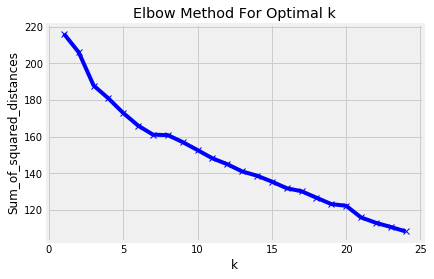

In [302]:
# set number of clusters
kclusters = range(1,25)
sum_of_squared_distances=[]

municipality_grouped_clustering = municipality_grouped_joined.drop('Municipality', 1)
municipality_grouped_clustering.replace('-',0,inplace=True)

#feature scaling to avoid bias by higher values
mms=MinMaxScaler()
mms.fit(municipality_grouped_clustering)
municipality_grouped_clustering = mms.transform(municipality_grouped_clustering)

# run k-means clustering
for k in kclusters:
    kmeans = KMeans(n_clusters=k, random_state=0).fit(municipality_grouped_clustering)
    sum_of_squared_distances.append(kmeans.inertia_)

#Plot the sum of squared distances aginst the number of clusters
plt.plot(kclusters, sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

The elbow method does not really work here, because the clusters are not distinct enough.

We proceed to use 7clusters as the curve first flattens at k=7.

As not every municipality could be found by Foursquare, we need to drop all of the municipalities containing NaN values.

In [303]:
# set number of clusters
kclusters = 7


# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(municipality_grouped_clustering)
sum_of_squared_distances.append(kmeans.inertia_)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

# add clustering labels
municipality_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

municipality_merged = Lux_municipality2018

# add latitude/longitude for each neighborhood
municipality_merged = municipality_merged.join(municipality_venues_sorted.set_index('Municipality'))
municipality_merged.dropna(inplace=True)
municipality_merged

,Population Density,Net Migration,Accident Victims,Unemployment rate,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Beaufort,204.949054,-19,1,9.79183,49.835042,6.289893,4.0,Hostel,Castle,Gastropub,Trail,Yoga Studio,Cupcake Shop,Food,Fast Food Restaurant,Event Space,Diner
Bech,54.268554,-10,2,2.53411,49.752011,6.362657,1.0,Wine Bar,Construction & Landscaping,Restaurant,Yoga Studio,Cupcake Shop,Food & Drink Shop,Food,Fast Food Restaurant,Event Space,Diner
Beckerich,88.630764,107,2,4.39276,49.730707,5.883009,1.0,Construction & Landscaping,Yoga Studio,Dessert Shop,French Restaurant,Food & Drink Shop,Food,Fast Food Restaurant,Event Space,Diner,Cupcake Shop
Berdorf,79.662563,53,2,4.94792,49.822329,6.350960,4.0,Hotel,Campground,Italian Restaurant,Cupcake Shop,Food & Drink Shop,Food,Fast Food Restaurant,Event Space,Diner,Dessert Shop
Bertrange,469.062680,142,14,4.47216,49.611535,6.049531,4.0,Restaurant,Pub,Basketball Stadium,Italian Restaurant,Lounge,French Restaurant,Bakery,Dessert Shop,Food,Fast Food Restaurant
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Walferdange,1157.082153,44,5,4.84794,49.658481,6.130639,3.0,Chinese Restaurant,Asian Restaurant,Music Venue,Italian Restaurant,French Restaurant,Construction & Landscaping,Comfort Food Restaurant,Convenience Store,Coffee Shop,Frozen Yogurt Shop
Weiswampach,52.283688,63,2,7.20524,50.139719,6.075315,1.0,Yoga Studio,Kitchen Supply Store,Restaurant,Furniture / Home Store,History Museum,Food & Drink Shop,Clothing Store,Cocktail Bar,Coffee Shop,Comfort Food Restaurant
Wiltz,174.929936,148,18,10.7629,49.966691,5.932102,4.0,Restaurant,Castle,Train Station,Bakery,Hotel,Arts & Entertainment,Dessert Shop,French Restaurant,Food & Drink Shop,Food
Wincrange,38.249824,46,15,4.5954,50.053449,5.914958,1.0,Industrial Estate,Yoga Studio,Cupcake Shop,Food & Drink Shop,Food,Fast Food Restaurant,Event Space,Diner,Dessert Shop,Cosmetics Shop


In [304]:
# create map of Luxembourg using latitude and longitude values
map_clusters = folium.Map(location=[lux_latitude, lux_longitude], zoom_start=9)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, name, cluster in zip(municipality_merged['Latitude'], municipality_merged['Longitude'], municipality_merged.index, municipality_merged['Cluster Labels']):
    label = folium.Popup(name + ' Cluster ' + str(cluster+1), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

## Examine the Clusters

__Cluster 1__: Contains Asian / Italian restaurants and other food places

In [305]:
municipality_merged.loc[municipality_merged['Cluster Labels'] == 0,municipality_merged.columns[list(range(0,4)) + list(range(6, municipality_merged.shape[1]))]]



,Population Density,Net Migration,Accident Victims,Unemployment rate,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Bettembourg,512.005584,192,33,4.71332,0.0,Chinese Restaurant,Asian Restaurant,Restaurant,Café,Pub,Italian Restaurant,Water Park,Comfort Food Restaurant,Coffee Shop,Cocktail Bar
Differdange,1180.928765,469,47,8.5597,0.0,Shopping Mall,Diner,Italian Restaurant,Lounge,Dessert Shop,Yoga Studio,Cupcake Shop,Food,Fast Food Restaurant,Event Space
Dudelange,976.099158,241,52,6.75003,0.0,Italian Restaurant,Bar,Pizza Place,Plaza,Sandwich Place,Grocery Store,Fast Food Restaurant,Pub,Coffee Shop,Cocktail Bar
Grosbous,52.411735,25,6,4.33213,0.0,Furniture / Home Store,Pizza Place,Italian Restaurant,Cupcake Shop,Food & Drink Shop,Food,Fast Food Restaurant,Event Space,Diner,Dessert Shop
Hesperange,560.102866,172,7,4.1567,0.0,Italian Restaurant,Sushi Restaurant,Chinese Restaurant,Soccer Field,Pharmacy,Restaurant,Bakery,Sculpture Garden,Asian Restaurant,Construction & Landscaping
Lintgen,199.278689,49,1,4.9505,0.0,Gas Station,Bar,Italian Restaurant,Train Station,Dessert Shop,French Restaurant,Food & Drink Shop,Food,Fast Food Restaurant,Event Space
Lorentzweiler,228.424069,93,6,3.71725,0.0,Pizza Place,Volleyball Court,Train Station,Business Service,Yoga Studio,Cosmetics Shop,Food,Fast Food Restaurant,Event Space,Diner
Mertzig,199.279279,32,-,5.0815,0.0,Bistro,Pub,Italian Restaurant,Dessert Shop,French Restaurant,Food & Drink Shop,Food,Fast Food Restaurant,Event Space,Diner
Parc Hosingen,49.469214,87,9,4.67405,0.0,Water Park,Comfort Food Restaurant,Italian Restaurant,Yoga Studio,Cupcake Shop,Food & Drink Shop,Food,Fast Food Restaurant,Event Space,Diner
Roeser,263.781513,145,25,4.03527,0.0,German Restaurant,Massage Studio,Athletics & Sports,Italian Restaurant,Yoga Studio,Dessert Shop,Food & Drink Shop,Food,Fast Food Restaurant,Event Space


__Cluster 2__: Biggest and most diverse cluster containing shops but also real estate and yoga studios

In [307]:
municipality_merged.loc[municipality_merged['Cluster Labels'] == 1,municipality_merged.columns[list(range(0,4)) + list(range(6, municipality_merged.shape[1]))]]

,Population Density,Net Migration,Accident Victims,Unemployment rate,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Bech,54.268554,-10,2,2.53411,1.0,Wine Bar,Construction & Landscaping,Restaurant,Yoga Studio,Cupcake Shop,Food & Drink Shop,Food,Fast Food Restaurant,Event Space,Diner
Beckerich,88.630764,107,2,4.39276,1.0,Construction & Landscaping,Yoga Studio,Dessert Shop,French Restaurant,Food & Drink Shop,Food,Fast Food Restaurant,Event Space,Diner,Cupcake Shop
Betzdorf,149.079755,101,2,3.34347,1.0,Restaurant,Train Station,Yoga Studio,Cupcake Shop,Food & Drink Shop,Food,Fast Food Restaurant,Event Space,Diner,Dessert Shop
Bissen,149.156627,78,7,4.34193,1.0,Chinese Restaurant,Argentinian Restaurant,Real Estate Office,Bar,Cupcake Shop,Food & Drink Shop,Food,Fast Food Restaurant,Event Space,Diner
Biwer,78.726170,53,5,3.50877,1.0,Home Service,Yoga Studio,Cupcake Shop,Food & Drink Shop,Food,Fast Food Restaurant,Event Space,Diner,Dessert Shop,Cosmetics Shop
Boulaide,39.091192,47,2,6.02837,1.0,Gastropub,Restaurant,Burger Joint,Yoga Studio,Cupcake Shop,Food,Fast Food Restaurant,Event Space,Diner,Dessert Shop
Bous,105.055087,20,7,2.22772,1.0,Business Service,Industrial Estate,Bowling Alley,Soccer Field,Comfort Food Restaurant,Coffee Shop,Construction & Landscaping,Convenience Store,Cosmetics Shop,Cocktail Bar
Colmar-Berg,180.178716,-42,1,5.35373,1.0,Pool,Furniture / Home Store,Park,Restaurant,Skate Park,Soccer Field,Castle,Gym,Grocery Store,Chinese Restaurant
Dalheim,119.178082,42,5,3.54331,1.0,Asian Restaurant,Yoga Studio,Dessert Shop,French Restaurant,Food & Drink Shop,Food,Fast Food Restaurant,Event Space,Diner,Cupcake Shop
Dippach,241.676234,113,9,4.38457,1.0,Asian Restaurant,Bar,Japanese Restaurant,Furniture / Home Store,Yoga Studio,Diner,French Restaurant,Food & Drink Shop,Food,Fast Food Restaurant


__Cluster 3__: Remich as a single point closest to the river and with lots of restaurants.

In [308]:
municipality_merged.loc[municipality_merged['Cluster Labels'] == 2,municipality_merged.columns[list(range(0,4)) + list(range(6, municipality_merged.shape[1]))]]

,Population Density,Net Migration,Accident Victims,Unemployment rate,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Remich,689.035917,69,8,7.289,2.0,Hotel,Bagel Shop,Restaurant,Other Great Outdoors,Fast Food Restaurant,Bakery,Mediterranean Restaurant,Pizza Place,Indian Restaurant,Ice Cream Shop


__Cluster 4__: Diverse Cluster with restaurants and playgrounds

In [309]:
municipality_merged.loc[municipality_merged['Cluster Labels'] == 3,municipality_merged.columns[list(range(0,4)) + list(range(6, municipality_merged.shape[1]))]]

,Population Density,Net Migration,Accident Victims,Unemployment rate,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Bettendorf,121.385542,22,3,4.91037,3.0,French Restaurant,Lake,Pub,Campground,Food & Drink Shop,Food,Fast Food Restaurant,Event Space,Diner,Dessert Shop
Contern,185.693431,47,9,4.47958,3.0,Grocery Store,French Restaurant,Home Service,Basketball Court,Bus Station,Bowling Alley,Yoga Studio,Food & Drink Shop,Food,Fast Food Restaurant
Helperknapp,111.060888,39,17,1.31234,3.0,Pub,Construction & Landscaping,Gourmet Shop,French Restaurant,Yoga Studio,Dessert Shop,Food,Fast Food Restaurant,Event Space,Diner
Kayl,612.247645,207,19,5.70486,3.0,Gourmet Shop,Building,Park,French Restaurant,Yoga Studio,Dessert Shop,Food,Fast Food Restaurant,Event Space,Diner
Kopstal,485.949367,39,10,3.99485,3.0,Arcade,Mountain,French Restaurant,Bar,Food & Drink Shop,Food,Fast Food Restaurant,Event Space,Diner,Dessert Shop
Mondorf-les-Bains,372.035139,233,18,5.88781,3.0,French Restaurant,Hotel,Italian Restaurant,Resort,Restaurant,Casino,Coffee Shop,Comfort Food Restaurant,Cocktail Bar,Food & Drink Shop
Niederanven,148.839458,74,22,4.48625,3.0,French Restaurant,Bus Station,Food & Drink Shop,Arts & Crafts Store,Trattoria/Osteria,Food,Fast Food Restaurant,Event Space,Diner,Dessert Shop
Schifflange,1394.293126,404,9,6.83108,3.0,French Restaurant,Automotive Shop,Italian Restaurant,Train Station,Grocery Store,Food & Drink Shop,Food,Fast Food Restaurant,Event Space,Diner
Stadtbredimus,187.217306,-21,6,4.34783,3.0,Hotel,Canal Lock,Restaurant,French Restaurant,Cupcake Shop,Food,Fast Food Restaurant,Event Space,Diner,Dessert Shop
Walferdange,1157.082153,44,5,4.84794,3.0,Chinese Restaurant,Asian Restaurant,Music Venue,Italian Restaurant,French Restaurant,Construction & Landscaping,Comfort Food Restaurant,Convenience Store,Coffee Shop,Frozen Yogurt Shop


__Cluster 5__: Cluster marked by hotels and historical sites

In [310]:
municipality_merged.loc[municipality_merged['Cluster Labels'] == 4,municipality_merged.columns[list(range(0,4)) + list(range(6, municipality_merged.shape[1]))]]

,Population Density,Net Migration,Accident Victims,Unemployment rate,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Beaufort,204.949054,-19,1,9.79183,4.0,Hostel,Castle,Gastropub,Trail,Yoga Studio,Cupcake Shop,Food,Fast Food Restaurant,Event Space,Diner
Berdorf,79.662563,53,2,4.94792,4.0,Hotel,Campground,Italian Restaurant,Cupcake Shop,Food & Drink Shop,Food,Fast Food Restaurant,Event Space,Diner,Dessert Shop
Bertrange,469.062680,142,14,4.47216,4.0,Restaurant,Pub,Basketball Stadium,Italian Restaurant,Lounge,French Restaurant,Bakery,Dessert Shop,Food,Fast Food Restaurant
Bourscheid,47.856755,-46,9,6.47482,4.0,Hotel,Arts & Crafts Store,Scenic Lookout,Cupcake Shop,Food & Drink Shop,Food,Fast Food Restaurant,Event Space,Diner,Dessert Shop
Clervaux,61.469724,101,23,7.92733,4.0,Hotel,History Museum,Italian Restaurant,French Restaurant,Breakfast Spot,Restaurant,Resort,Dessert Shop,Lounge,Bistro
Consdorf,77.954899,11,9,4.27928,4.0,Soccer Field,Pet Store,Bar,Bakery,Diner,French Restaurant,Food & Drink Shop,Food,Fast Food Restaurant,Event Space
Diekirch,543.961353,257,21,7.54717,4.0,History Museum,Steakhouse,Bar,Restaurant,Bakery,Pub,Campground,Movie Theater,Italian Restaurant,Miscellaneous Shop
Echternach,273.987311,29,20,7.11948,4.0,Hotel,Bakery,Diner,French Restaurant,Bar,Italian Restaurant,Plaza,Steakhouse,Pizza Place,Park
Esch-sur-Alzette,2441.811847,329,86,10.0967,4.0,Italian Restaurant,Gastropub,Park,Paper / Office Supplies Store,Asian Restaurant,Train Station,Grocery Store,Thai Restaurant,Restaurant,Convenience Store
Esch-sur-Sûre,51.521654,61,16,5.7377,4.0,Hotel,Historic Site,Bar,Bakery,Restaurant,French Restaurant,Construction & Landscaping,Convenience Store,Comfort Food Restaurant,Cosmetics Shop


__Cluster 6__: Luxembourg as most densely populated municipality

In [295]:
municipality_merged.loc[municipality_merged['Cluster Labels'] == 5,municipality_merged.columns[list(range(0,4)) + list(range(6, municipality_merged.shape[1]))]]

,Population Density,Net Migration,Accident Victims,Unemployment rate,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
Luxembourg,2260.454722,2486,197,6.52673,5.0,Bar,Italian Restaurant,French Restaurant,Clothing Store,Plaza


__Cluster 7__: Schuttrange containing a cosmetic shop, not densely populated and in close proximity of a river.

In [311]:
municipality_merged.loc[municipality_merged['Cluster Labels'] == 6,municipality_merged.columns[list(range(0,4)) + list(range(6, municipality_merged.shape[1]))]]

,Population Density,Net Migration,Accident Victims,Unemployment rate,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Schuttrange,258.136646,-12,1,4.13534,6.0,Cosmetics Shop,Sports Bar,Pharmacy,Trattoria/Osteria,Music Venue,Cupcake Shop,Food,Fast Food Restaurant,Event Space,Diner


## Cluster the Cantons

In [347]:
LIMIT=100 #limit of number of venues returned by Foursquare API


def getNearbyVenues(names, latitudes, longitudes, radius=2000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Canton', 
                  'Canton Latitude', 
                  'Canton Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [348]:
canton_venues = getNearbyVenues(names=Lux_canton2018.index,
                                   latitudes=Lux_canton2018['Latitude'],
                                   longitudes=Lux_canton2018['Longitude'],
                                  )


Canton Capellen
Canton Clervaux
Canton Diekirch
Canton Echternach
Canton Esch
Canton Grevenmacher
Canton Luxembourg
Canton Mersch
Canton Redange
Canton Remich
Canton Vianden
Canton Wiltz


In [349]:
print("The size of the dataframe is: ", canton_venues.shape)
print('There are {} uniques categories.'.format(len(canton_venues['Venue Category'].unique())))

The size of the dataframe is:  (197, 7)
There are 91 uniques categories.


In [350]:
# one hot encoding
canton_onehot = pd.get_dummies(canton_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
canton_onehot['Canton'] = canton_venues['Canton'] 

# move neighborhood column to the first column
fixed_columns = [canton_onehot.columns[-1]] + list(canton_onehot.columns[:-1])
canton_onehot =canton_onehot[fixed_columns]

print("The size of the dataframe is: ",canton_onehot.shape)

The size of the dataframe is:  (197, 92)


In [351]:
canton_grouped = canton_onehot.groupby('Canton').mean().reset_index()
print("The size of the new dataframe with means is: ",canton_grouped.size)
canton_grouped

The size of the new dataframe with means is:  1104


,Canton,American Restaurant,Art Museum,Asian Restaurant,Automotive Shop,Bakery,Bar,Basketball Court,Boutique,Brasserie,...,Spanish Restaurant,Sporting Goods Shop,Sports Bar,Stables,Steakhouse,Supermarket,Sushi Restaurant,Thai Restaurant,Trail,Train Station
0,Canton Capellen,0.043478,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.000000,0.00,0.00,0.00,0.00,0.00,0.043478
1,Canton Clervaux,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.000000,0.00,0.00,0.00,0.00,0.00,0.000000
2,Canton Diekirch,0.000000,0.00,0.00,0.00,0.00,0.10,0.00,0.00,0.00,...,0.00,0.05,0.00,0.000000,0.05,0.00,0.00,0.00,0.00,0.000000
3,Canton Echternach,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.000000,0.00,0.00,0.00,0.00,0.00,0.000000
4,Canton Esch,0.000000,0.00,0.00,0.00,0.04,0.00,0.04,0.00,0.00,...,0.00,0.00,0.04,0.000000,0.00,0.12,0.04,0.00,0.00,0.040000
5,Canton Grevenmacher,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.000000,0.00,0.00,0.00,0.00,0.00,0.200000
6,Canton Luxembourg,0.000000,0.01,0.01,0.00,0.01,0.07,0.00,0.01,0.01,...,0.01,0.00,0.00,0.000000,0.00,0.00,0.00,0.01,0.01,0.000000
7,Canton Mersch,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.000000,0.00,0.00,0.00,0.00,0.00,0.000000
8,Canton Redange,0.000000,0.00,0.00,0.25,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.000000,0.00,0.00,0.00,0.00,0.00,0.000000
9,Canton Remich,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.333333,0.00,0.00,0.00,0.00,0.00,0.000000


In [352]:
num_top_venues = 10

def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Canton']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
canton_venues_sorted = pd.DataFrame(columns=columns)
canton_venues_sorted['Canton'] = canton_grouped['Canton']

for ind in np.arange(canton_grouped.shape[0]):
    canton_venues_sorted.iloc[ind, 1:] = return_most_common_venues(canton_grouped.iloc[ind, :], num_top_venues)

canton_venues_sorted.tail()


,Canton,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
7,Canton Mersch,Shopping Mall,Portuguese Restaurant,Gastropub,Restaurant,Food & Drink Shop,Cupcake Shop,Department Store,Dessert Shop,Diner,Donut Shop
8,Canton Redange,Furniture / Home Store,Automotive Shop,Garden Center,Train Station,Food Truck,Department Store,Dessert Shop,Diner,Donut Shop,Fast Food Restaurant
9,Canton Remich,Stables,French Restaurant,Sauna / Steam Room,Train Station,Food & Drink Shop,Cupcake Shop,Department Store,Dessert Shop,Diner,Donut Shop
10,Canton Vianden,Plaza,Mountain,Food & Drink Shop,Cupcake Shop,Department Store,Dessert Shop,Diner,Donut Shop,Fast Food Restaurant,Fishing Spot
11,Canton Wiltz,Memorial Site,Restaurant,Train Station,Department Store,Dessert Shop,Diner,Donut Shop,Fast Food Restaurant,Fishing Spot,Food


In [353]:
Lux_canton2018.sort_index(inplace=True)
canton_grouped.set_index("Canton",inplace=True)
canton_grouped_joined = canton_grouped.join(Lux_canton2018.loc[:,"Population Density":"Unemployment rate"])
canton_grouped_joined.reset_index(inplace=True)


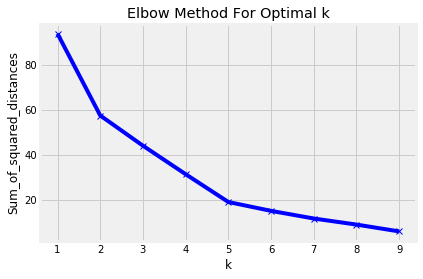

In [354]:
# set number of clusters
kclusters = range(1,10)
sum_of_squared_distances=[]

canton_grouped_clustering = canton_grouped_joined.drop('Canton', 1)
canton_grouped_clustering.replace('-',0,inplace=True)

#feature scaling to avoid bias by higher values
mms=MinMaxScaler()
mms.fit(canton_grouped_clustering)
canton_grouped_clustering = mms.transform(canton_grouped_clustering)

# run k-means clustering
for k in kclusters:
    kmeans = KMeans(n_clusters=k, random_state=0).fit(canton_grouped_clustering)
    sum_of_squared_distances.append(kmeans.inertia_)

#Plot the sum of squared distances aginst the number of clusters
plt.plot(kclusters, sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

The elbow method works fine here, indicating that we need 5 clusters!

In [355]:
# set number of clusters
kclusters = 5


# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(canton_grouped_clustering)
sum_of_squared_distances.append(kmeans.inertia_)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

# add clustering labels
canton_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

canton_merged = Lux_canton2018

# add latitude/longitude for each neighborhood
canton_merged = canton_merged.join(canton_venues_sorted.set_index('Canton'))
canton_merged

,Population Density,Net Migration,Accident Victims,Unemployment rate,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Canton & Municipality,,,,,,,,,,,,,,,,,
Canton Capellen,241.890467,872,87,4.26597,49.634963,5.973227,2,Italian Restaurant,Smoke Shop,Restaurant,Train Station,French Restaurant,Pharmacy,Indian Restaurant,Gym / Fitness Center,Gym,Food Truck
Canton Clervaux,52.842154,322,57,6.05774,50.057512,5.985320,0,Golf Course,Plaza,Furniture / Home Store,Food & Drink Shop,Cupcake Shop,Department Store,Dessert Shop,Diner,Donut Shop,Fast Food Restaurant
Canton Diekirch,159.126693,640,82,6.62016,49.870316,6.143654,4,History Museum,Restaurant,Bar,Food,Italian Restaurant,Fast Food Restaurant,Chinese Restaurant,Pub,Diner,Fishing Spot
Canton Echternach,101.859437,22,43,5.54171,49.795136,6.380557,0,Hotel,Forest,Campground,Food & Drink Shop,Train Station,Dessert Shop,Diner,Donut Shop,Fast Food Restaurant,Fishing Spot
Canton Esch,728.343700,3108,397,7.19815,49.518852,5.999277,3,Italian Restaurant,Supermarket,Fast Food Restaurant,Train Station,Shopping Mall,French Restaurant,Indian Restaurant,Paper / Office Supplies Store,Concert Hall,Clothing Store
Canton Grevenmacher,141.117472,514,50,4.16539,49.672893,6.358078,0,Restaurant,Train Station,French Restaurant,Playground,Food,Cupcake Shop,Department Store,Dessert Shop,Diner,Donut Shop
Canton Luxembourg,765.776231,3384,288,5.81024,49.604759,6.142578,1,Bar,Hotel,Italian Restaurant,French Restaurant,Café,Indian Restaurant,Pub,Coffee Shop,Restaurant,Historic Site
Canton Mersch,143.421170,515,60,4.26243,49.757900,6.134055,0,Shopping Mall,Portuguese Restaurant,Gastropub,Restaurant,Food & Drink Shop,Cupcake Shop,Department Store,Dessert Shop,Diner,Donut Shop
Canton Redange,69.774571,403,56,5.17736,49.795282,5.902929,0,Furniture / Home Store,Automotive Shop,Garden Center,Train Station,Food Truck,Department Store,Dessert Shop,Diner,Donut Shop,Fast Food Restaurant


In [356]:
# create map of Luxembourg using latitude and longitude values
map_clusters = folium.Map(location=[lux_latitude, lux_longitude], zoom_start=9)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, name, cluster in zip(canton_merged['Latitude'], canton_merged['Longitude'], canton_merged.index, canton_merged['Cluster Labels']):
    label = folium.Popup(name + ' Cluster ' + str(cluster+1), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

## Examine the Canton Clusters

__Cluster 1__: Cluster of the smallest cantons by population density, low amounts of accident victims and mostly away from main highways.

In [357]:
canton_merged.loc[canton_merged['Cluster Labels'] == 0,canton_merged.columns[list(range(0,4)) + list(range(6, canton_merged.shape[1]))]]

,Population Density,Net Migration,Accident Victims,Unemployment rate,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Canton & Municipality,,,,,,,,,,,,,,,
Canton Clervaux,52.842154,322,57,6.05774,0,Golf Course,Plaza,Furniture / Home Store,Food & Drink Shop,Cupcake Shop,Department Store,Dessert Shop,Diner,Donut Shop,Fast Food Restaurant
Canton Echternach,101.859437,22,43,5.54171,0,Hotel,Forest,Campground,Food & Drink Shop,Train Station,Dessert Shop,Diner,Donut Shop,Fast Food Restaurant,Fishing Spot
Canton Grevenmacher,141.117472,514,50,4.16539,0,Restaurant,Train Station,French Restaurant,Playground,Food,Cupcake Shop,Department Store,Dessert Shop,Diner,Donut Shop
Canton Mersch,143.421170,515,60,4.26243,0,Shopping Mall,Portuguese Restaurant,Gastropub,Restaurant,Food & Drink Shop,Cupcake Shop,Department Store,Dessert Shop,Diner,Donut Shop
Canton Redange,69.774571,403,56,5.17736,0,Furniture / Home Store,Automotive Shop,Garden Center,Train Station,Food Truck,Department Store,Dessert Shop,Diner,Donut Shop,Fast Food Restaurant
Canton Remich,174.912020,424,66,4.77139,0,Stables,French Restaurant,Sauna / Steam Room,Train Station,Food & Drink Shop,Cupcake Shop,Department Store,Dessert Shop,Diner,Donut Shop
Canton Vianden,65.753948,133,17,6.03483,0,Plaza,Mountain,Food & Drink Shop,Cupcake Shop,Department Store,Dessert Shop,Diner,Donut Shop,Fast Food Restaurant,Fishing Spot
Canton Wiltz,63.258363,322,51,7.65279,0,Memorial Site,Restaurant,Train Station,Department Store,Dessert Shop,Diner,Donut Shop,Fast Food Restaurant,Fishing Spot,Food


__Cluster 2__: Luxembourg as the most densely populated canton

In [358]:
canton_merged.loc[canton_merged['Cluster Labels'] == 1,canton_merged.columns[list(range(0,4)) + list(range(6, canton_merged.shape[1]))]]

,Population Density,Net Migration,Accident Victims,Unemployment rate,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Canton & Municipality,,,,,,,,,,,,,,,
Canton Luxembourg,765.776231,3384,288,5.81024,1,Bar,Hotel,Italian Restaurant,French Restaurant,Café,Indian Restaurant,Pub,Coffee Shop,Restaurant,Historic Site


__Cluster 3__: Capellen with a low unemployment rate and a variety of restaurants and shops due to several shopping malls in this canton.

In [360]:
canton_merged.loc[canton_merged['Cluster Labels'] == 2,canton_merged.columns[list(range(0,4)) + list(range(6, canton_merged.shape[1]))]]

,Population Density,Net Migration,Accident Victims,Unemployment rate,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Canton & Municipality,,,,,,,,,,,,,,,
Canton Capellen,241.890467,872,87,4.26597,2,Italian Restaurant,Smoke Shop,Restaurant,Train Station,French Restaurant,Pharmacy,Indian Restaurant,Gym / Fitness Center,Gym,Food Truck


__Cluster 4__: Esch as second largest canton by population density, having a high unemployment rate and the highest number of accidents!

In [361]:
canton_merged.loc[canton_merged['Cluster Labels'] == 3,canton_merged.columns[list(range(0,4)) + list(range(6, canton_merged.shape[1]))]]

,Population Density,Net Migration,Accident Victims,Unemployment rate,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Canton & Municipality,,,,,,,,,,,,,,,
Canton Esch,728.3437,3108,397,7.19815,3,Italian Restaurant,Supermarket,Fast Food Restaurant,Train Station,Shopping Mall,French Restaurant,Indian Restaurant,Paper / Office Supplies Store,Concert Hall,Clothing Store


__Cluster 5__: Diekirch with high net migration apart from Esch and Luxembourg, with a well-known History museum as most common venue

In [362]:
canton_merged.loc[canton_merged['Cluster Labels'] == 4,canton_merged.columns[list(range(0,4)) + list(range(6, canton_merged.shape[1]))]]

,Population Density,Net Migration,Accident Victims,Unemployment rate,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Canton & Municipality,,,,,,,,,,,,,,,
Canton Diekirch,159.126693,640,82,6.62016,4,History Museum,Restaurant,Bar,Food,Italian Restaurant,Fast Food Restaurant,Chinese Restaurant,Pub,Diner,Fishing Spot


# Final Thoughts

Analysis of several data sets not only allowed to identify trends in Luxembourg as a country, but specificly in the 12 cantons.

Luxembourg is too small to consider big variations within the municipalities, as demonstrated by an rather unsuccessful attempt of clustering with venues. Clustering the canton however highlighted what was previously observed in the line plots and clarified that at most 5 distinct clusters of cantons exist: Luxembourg, Esch, Capellen, Diekirch and the rest.

The data analysis could serve as a guideline to choose a residence. Higher number of accidents is related to traffic, whereas low net migration together with population density indicates that the areas are not overcrowding.
In the end, the top 10 venues give a good overview of what to expect when chosing a new residence.